## Q3 - Image Completion

In [17]:
# import our needed libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random 
from numba import jit
import time 
plt.rcParams['figure.figsize'] = (20, 10)

# Define our needed functions -------------------------------
# function for reading an image from its path
def reading_image(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

# showing an image by matplotlib library
def showing_image(image): 
    plt.figure()
    plt.imshow(image, cmap='gray')
    plt.show()

# function for creating a hole in an image
def hole_creating(img_in, pixels):
    img_out = img_in.copy()
    for pixel in pixels:
        img_out[pixel[0]:pixel[2], pixel[1]:pixel[3]] = 0
    return img_out

# function for pick a slide to tecture synthesis
def pick_random_slide(img_in, w=50, l=50, hole_zone=[]):
    img_w = img_in.shape[0]
    img_l = img_in.shape[1]
    
    # check to be not in a hole
    in_hole = True
    while in_hole:
        
        # pick a random (x, y)
        x = random.randint(0, img_w - w)
        y = random.randint(0, img_l - l)
        
        # check is in hole or not? 
        in_hole = False
        for hole in hole_zone:
            if (x + w > hole[0]) & (y + l > hole[1]) & (hole[0] + hole[2] > x) & (hole[1] + hole[3] > y):
                in_hole = True
    
    img = img_in[x:x+w, y:y+l]
    return img

# function for pick best slide 
def pick_best_slide(img_in, x_loc, y_loc, w=50, l=50, w2=20,
                    l2=20, hole_zone=[], random_p=20000, k=4, step=4, Th1=1.1, x1=100,
                    y1=100, x2=1500-100, y2=1500-100, neigbors=['up']):
    # create a list including all possibles pixels to check matching
    pixels = [(i, j) for i in range(x1, x2, k) for j in range(y1, y2, k)]
    pixels_len = int(np.ceil((x2 - x1) / k) * np.ceil((y2 - y1) / k))
#     print('pixels len : ', pixels_len)
        
    # create location of image
    img_loc_up = img_in[x_loc-w2:x_loc, y_loc-l2:y_loc+l+l2]
    img_loc_down = img_in[x_loc+w:x_loc+w+w2, y_loc-l2:y_loc+l+l2]
    img_loc_left = img_in[x_loc-w2:x_loc+w+w2, y_loc-l2:y_loc]
    img_loc_right = img_in[x_loc-w2:x_loc+w+w2, y_loc+l:y_loc+l+l2]

    
    # set initial variables
    min_score = np.inf
    best_slide = (0, 0)
    
    # loop over pixels randomly
    for i in range(np.min((pixels_len, random_p))):
        
        # check to not to be in a hole
        in_hole = True
        while in_hole:
            
            # pick a random pixel to check matching 
            indx = random.randint(0, pixels_len - i - 1)
            pixel = pixels.pop(indx)
            pixel_x = pixel[0]
            pixel_y = pixel[1]
            
            # check is in hole or not? 
            in_hole = False
            for hole in hole_zone:
                if (pixel_x + w > hole[0]) & (pixel_y + l > hole[1]) & (hole[0] + hole[2] > pixel_x) & (hole[1] + hole[3] > pixel_y):
                    in_hole = True
                    
            if in_hole:
                pixels_len -=1
            
            
        
        img_up = img_in[pixel_x-w2:pixel_x, pixel_y-l2:pixel_y+l+l2]
        img_down = img_in[pixel_x+w:pixel_x+w+w2, pixel_y-l2:pixel_y+l+l2]
        img_left = img_in[pixel_x-w2:pixel_x+w+w2, pixel_y-l2:pixel_y]
        img_right = img_in[pixel_x-w2:pixel_x+w+w2, pixel_y+l:pixel_y+l+l2]
        
        # Cross Corelation to check matching
        score = 0
        for neigbor in neigbors:
            if neigbor == 'up':
                score += (np.sum((img_up - img_loc_up)**2))
            elif neigbor == 'down':
                score += (np.sum((img_down - img_loc_down)**2))
            elif neigbor == 'left':
                score += (np.sum((img_left - img_loc_left)**2))
            else:
                score += (np.sum((img_right - img_loc_right)**2))
        
        
        if score < min_score:
            best_slide = (pixel_x, pixel_y)
            min_score = score
            
        # if it is close to the location check its neighbors
        if score < Th1 * min_score:
            for i in range(1, k, step):
                for j in range(1, k, step):
                    x = pixel_x + i
                    y = pixel_y + j
                    
                    img_up = img_in[pixel_x-w2:pixel_x, pixel_y-l2:pixel_y+l+l2]
                    img_down = img_in[pixel_x+w:pixel_x+w+w2, pixel_y-l2:pixel_y+l+l2]
                    img_left = img_in[pixel_x-w2:pixel_x+w+w2, pixel_y-l2:pixel_y]
                    img_right = img_in[pixel_x-w2:pixel_x+w+w2, pixel_y+l:pixel_y+l+l2]
                    
                    
                    score = 0
                    for neigbor in neigbors:
                        if neigbor == 'up':
                            score += (np.sum((img_up - img_loc_up)**2))
                        elif neigbor == 'down':
                            score += (np.sum((img_down - img_loc_down)**2))
                        elif neigbor == 'left':
                            score += (np.sum((img_left - img_loc_left)**2))
                        elif neigbor == 'right':
                            score += (np.sum((img_right - img_loc_right)**2))
                            
                            
                    if score < min_score:
                        best_slide = (x, y)
                        min_score = score
        
    return best_slide
    

# this function is for hole filling by help of texture synthesis
def texture_synthesis(img_texture, x1, y1, x2, y2, w=50, l=50, w2=20, l2=20,
                      org_x1=100, org_y1=100, org_x2=1500-100, org_y2=1500-100,
                      hole_zone=[], random_p=20000, Cmode="Random", watch_creating=False):
#     img_out = np.zeros(shape=img_texture.shape)
#     img_out = img_out.astype(np.uint8)
    img_out = img_texture.copy()
    
    # initial first parameter
    mode = 0
    mode_c = [(1, 0), (0, 1), (-1, 0), (0, -1)]
    mode_current = 0 
    i = 1
    j = 1
    di = mode_c[mode][0]
    dj = mode_c[mode][1]
    a, b = np.meshgrid(range(x1, x2, w), range(y1, y2, l))
    c = np.zeros(shape=a.shape)
    y_len = c.shape[0]
    x_len = c.shape[1]
    state = np.dstack((a, b, c))
    
    # pad the array
    pad = ((1, 1), (1, 1), (0, 0))
    state = np.pad(state, pad, mode='constant', constant_values=1)
    
    # check all the blocks till any one be unseened
    counter = 0
    while not state[j][i][2]: 
        
        # set the variables
        x = int(state[j][i][0])
        y = int(state[j][i][1])
        
        # print the way 
#         print('x : ', x)
#         print('y : ', y)
#         print('i : ', i)
#         print('j : ', j)
        
        # mark this block that have slide now
        state[j][i][2] = 1

        # check for the end of each line 
        if (state[j+dj][i+di][2] == 1):
            mode += 1
            mode %= 4
            
            # update di and dj
            di = mode_c[mode][0]
            dj = mode_c[mode][1]
        

        # put the picked image in the specified location
        if Cmode == "Random":
            img = pick_random_slide(img_out, w=np.min((w, x2-x)), l=np.min((l, y2-y)), hole_zone=hole_zone)
            
        elif Cmode == "Best":
            
            # define neighbors
            neigbors = []
            if state[j][i+1][2] == 1:
                neigbors.append('down')
            if state[j][i-1][2] == 1:
                neigbors.append('up')
            if state[j+1][i][2] == 1:
                neigbors.append('right')
            if state[j-1][i][2] == 1:
                neigbors.append('left')
                
            
            (x_best, y_best) = pick_best_slide(img_out, x_loc=x, y_loc=y, w=np.min((w, x2-x)),
                                               l=np.min((l, y2-y)), w2=w2, l2=l2, hole_zone=hole_zone,
                                               random_p=random_p, x1=org_x1, y1=org_y1, x2=org_x2, y2=org_y2, neigbors=neigbors)
            img = img_out[x_best:x_best+np.min((w, x2-x)), y_best:y_best+np.min((l, y2-y))]
            
        img_out[x:x+np.min((w, x2-x)), y:y+np.min((l, y2-y))] = img
        
        # showing the image 
        if watch_creating:
            showing_image(img_out)
        
        # go to next slide 
        i += di
        j += dj
        mode_current = mode
        counter += 1
        
        # report to user
        print('slide ', counter, ' is done!')
    print('--------------')
    return img_out

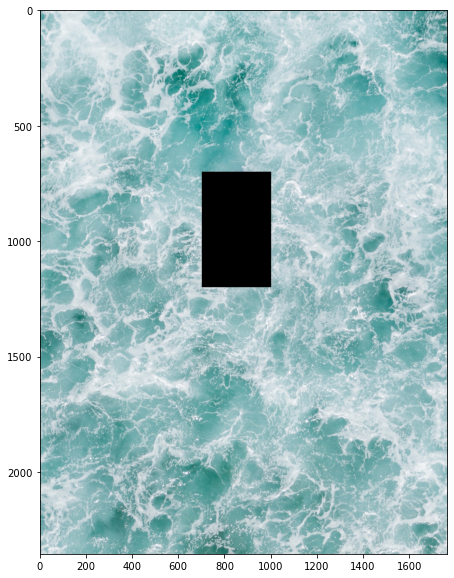

True

In [2]:
# Reading our images
img_org = reading_image('Swimmer.jpg')

# creating holes
hole_zone = []
hole_zone.append((700, 700, 1200, 1000))
img1 = hole_creating(img_org, hole_zone)

# Showing the images
showing_image(img1)

# saving the image
Q3_hole = cv2.cvtColor(img1, cv2.COLOR_RGB2BGR)
cv2.imwrite('Q3_hole.jpg', Q3_hole)

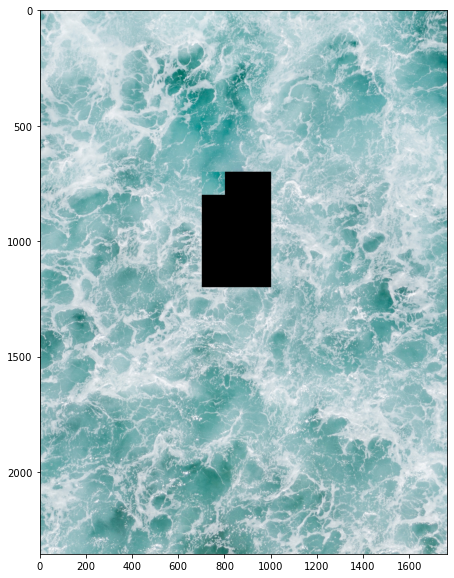

slide  1  is done!


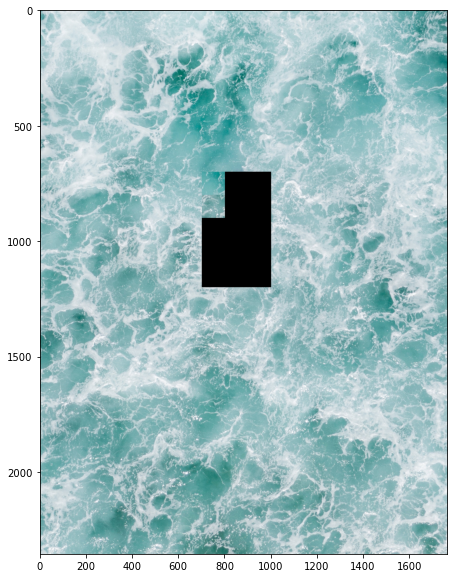

slide  2  is done!


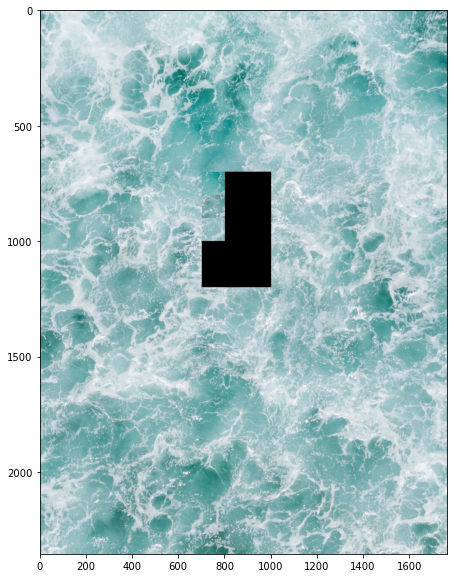

slide  3  is done!


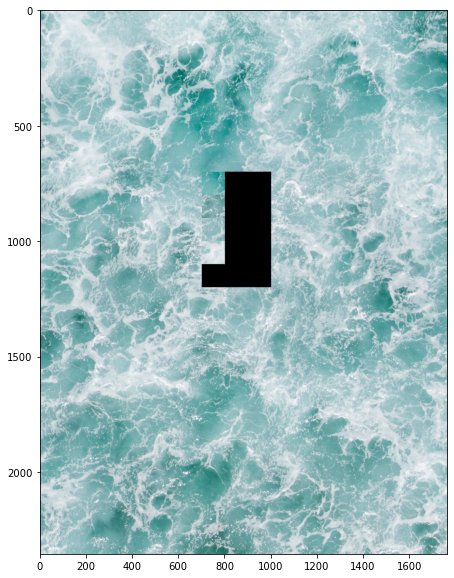

slide  4  is done!


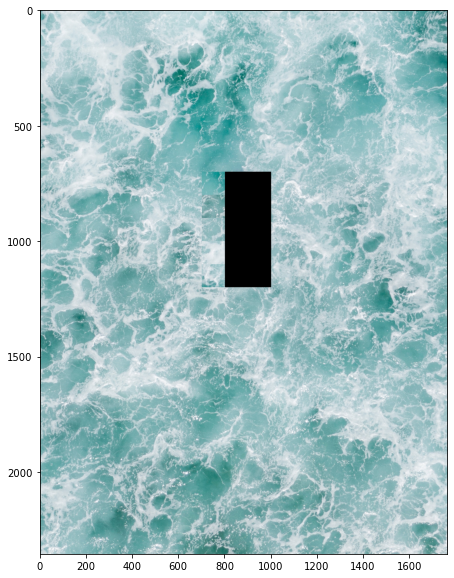

slide  5  is done!


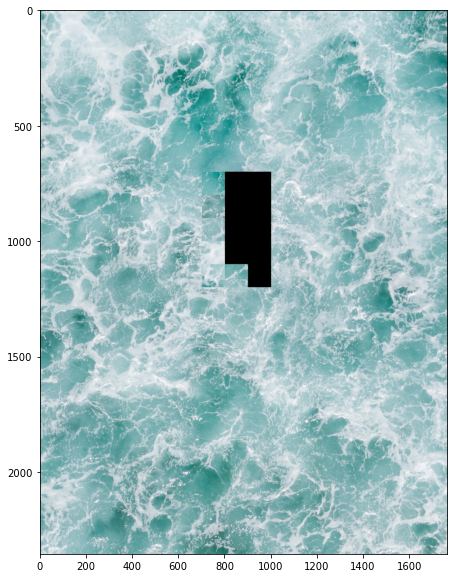

slide  6  is done!


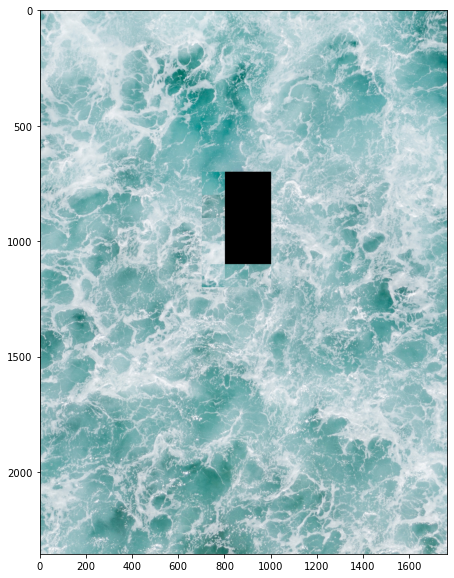

slide  7  is done!


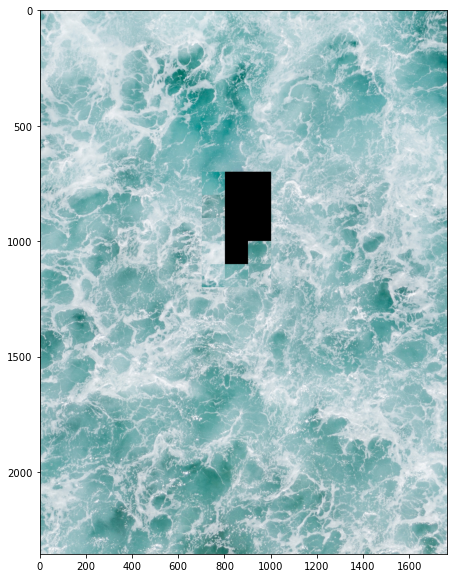

slide  8  is done!


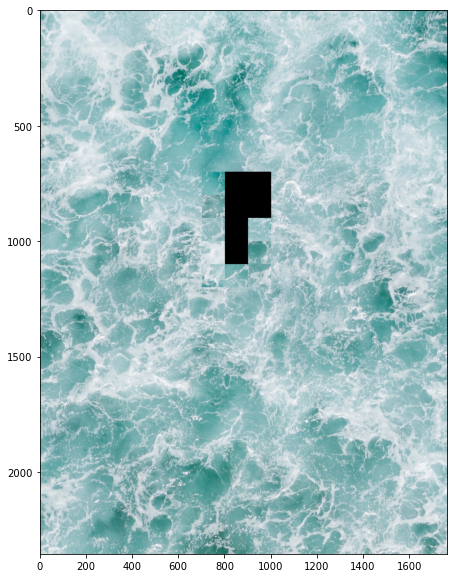

slide  9  is done!


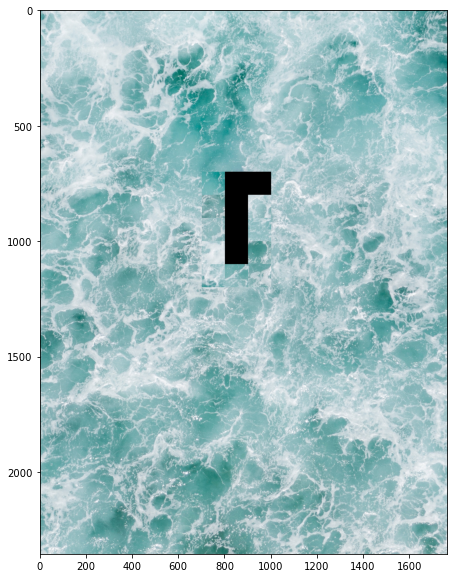

slide  10  is done!


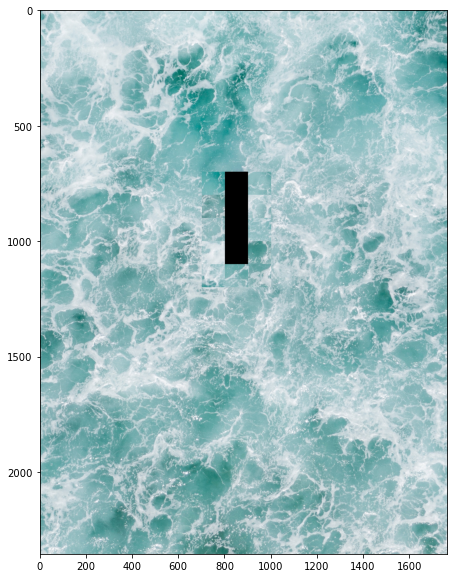

slide  11  is done!


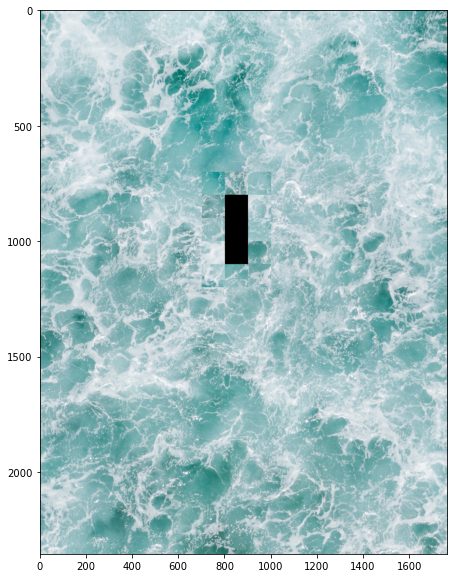

slide  12  is done!


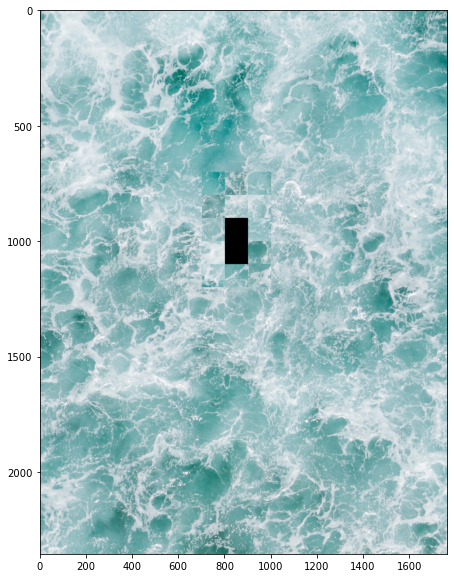

slide  13  is done!


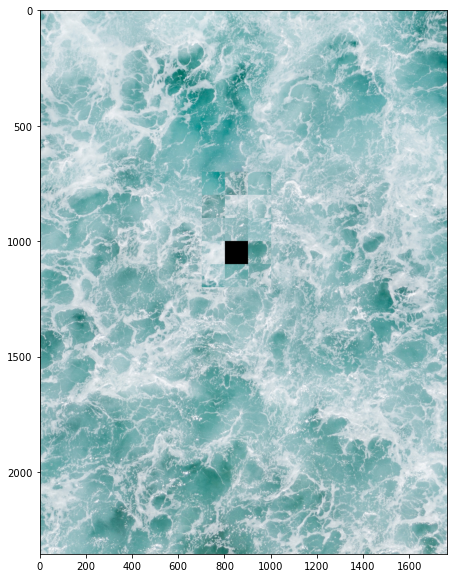

slide  14  is done!


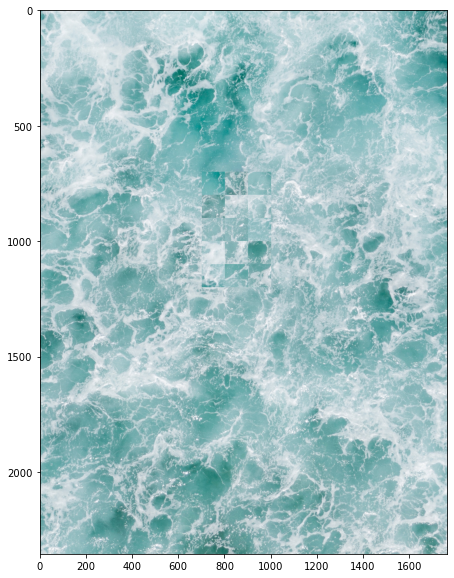

slide  15  is done!


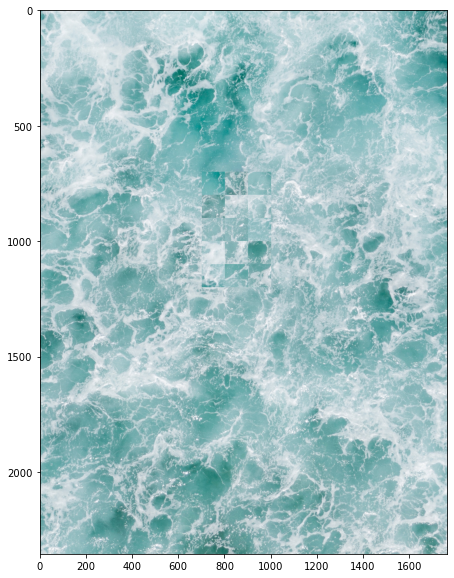

True

In [42]:
# run the algorithm
img2 = texture_synthesis(img1, 700, 700, 1200, 1000, w=100, l=100, hole_zone=hole_zone, Cmode="Random", watch_creating=True)
showing_image(img2)
result13_random = cv2.cvtColor(img2, cv2.COLOR_RGB2BGR)
cv2.imwrite('result13_random.jpg', result13_random)

slide  1  is done!
slide  2  is done!
slide  3  is done!
slide  4  is done!
slide  5  is done!
slide  6  is done!
slide  7  is done!
slide  8  is done!
slide  9  is done!
slide  10  is done!
slide  11  is done!
slide  12  is done!
slide  13  is done!
slide  14  is done!
slide  15  is done!
slide  16  is done!
slide  17  is done!
slide  18  is done!
slide  19  is done!
slide  20  is done!
slide  21  is done!
slide  22  is done!
slide  23  is done!
slide  24  is done!
slide  25  is done!
slide  26  is done!
slide  27  is done!
slide  28  is done!
slide  29  is done!
slide  30  is done!
slide  31  is done!
slide  32  is done!
slide  33  is done!
slide  34  is done!
slide  35  is done!
slide  36  is done!
slide  37  is done!
slide  38  is done!
slide  39  is done!
slide  40  is done!
slide  41  is done!
slide  42  is done!
slide  43  is done!
slide  44  is done!
slide  45  is done!
slide  46  is done!
slide  47  is done!
slide  48  is done!
slide  49  is done!
slide  50  is done!
slide  51

slide  401  is done!
slide  402  is done!
slide  403  is done!
slide  404  is done!
slide  405  is done!
slide  406  is done!
slide  407  is done!
slide  408  is done!
slide  409  is done!
slide  410  is done!
slide  411  is done!
slide  412  is done!
slide  413  is done!
slide  414  is done!
slide  415  is done!
slide  416  is done!
slide  417  is done!
slide  418  is done!
slide  419  is done!
slide  420  is done!
slide  421  is done!
slide  422  is done!
slide  423  is done!
slide  424  is done!
slide  425  is done!
slide  426  is done!
slide  427  is done!
slide  428  is done!
slide  429  is done!
slide  430  is done!
slide  431  is done!
slide  432  is done!
slide  433  is done!
slide  434  is done!
slide  435  is done!
slide  436  is done!
slide  437  is done!
slide  438  is done!
slide  439  is done!
slide  440  is done!
slide  441  is done!
slide  442  is done!
slide  443  is done!
slide  444  is done!
slide  445  is done!
slide  446  is done!
slide  447  is done!
slide  448  i

slide  802  is done!
slide  803  is done!
slide  804  is done!
slide  805  is done!
slide  806  is done!
slide  807  is done!
slide  808  is done!
slide  809  is done!
slide  810  is done!
slide  811  is done!
slide  812  is done!
slide  813  is done!
slide  814  is done!
slide  815  is done!
slide  816  is done!
slide  817  is done!
slide  818  is done!
slide  819  is done!
slide  820  is done!
slide  821  is done!
slide  822  is done!
slide  823  is done!
slide  824  is done!
slide  825  is done!
slide  826  is done!
slide  827  is done!
slide  828  is done!
slide  829  is done!
slide  830  is done!
slide  831  is done!
slide  832  is done!
slide  833  is done!
slide  834  is done!
slide  835  is done!
slide  836  is done!
slide  837  is done!
slide  838  is done!
slide  839  is done!
slide  840  is done!
slide  841  is done!
slide  842  is done!
slide  843  is done!
slide  844  is done!
slide  845  is done!
slide  846  is done!
slide  847  is done!
slide  848  is done!
slide  849  i

slide  1188  is done!
slide  1189  is done!
slide  1190  is done!
slide  1191  is done!
slide  1192  is done!
slide  1193  is done!
slide  1194  is done!
slide  1195  is done!
slide  1196  is done!
slide  1197  is done!
slide  1198  is done!
slide  1199  is done!
slide  1200  is done!
slide  1201  is done!
slide  1202  is done!
slide  1203  is done!
slide  1204  is done!
slide  1205  is done!
slide  1206  is done!
slide  1207  is done!
slide  1208  is done!
slide  1209  is done!
slide  1210  is done!
slide  1211  is done!
slide  1212  is done!
slide  1213  is done!
slide  1214  is done!
slide  1215  is done!
slide  1216  is done!
slide  1217  is done!
slide  1218  is done!
slide  1219  is done!
slide  1220  is done!
slide  1221  is done!
slide  1222  is done!
slide  1223  is done!
slide  1224  is done!
slide  1225  is done!
slide  1226  is done!
slide  1227  is done!
slide  1228  is done!
slide  1229  is done!
slide  1230  is done!
slide  1231  is done!
slide  1232  is done!
slide  123

slide  1576  is done!
slide  1577  is done!
slide  1578  is done!
slide  1579  is done!
slide  1580  is done!
slide  1581  is done!
slide  1582  is done!
slide  1583  is done!
slide  1584  is done!
slide  1585  is done!
slide  1586  is done!
slide  1587  is done!
slide  1588  is done!
slide  1589  is done!
slide  1590  is done!
slide  1591  is done!
slide  1592  is done!
slide  1593  is done!
slide  1594  is done!
slide  1595  is done!
slide  1596  is done!
slide  1597  is done!
slide  1598  is done!
slide  1599  is done!
slide  1600  is done!
slide  1601  is done!
slide  1602  is done!
slide  1603  is done!
slide  1604  is done!
slide  1605  is done!
slide  1606  is done!
slide  1607  is done!
slide  1608  is done!
slide  1609  is done!
slide  1610  is done!
slide  1611  is done!
slide  1612  is done!
slide  1613  is done!
slide  1614  is done!
slide  1615  is done!
slide  1616  is done!
slide  1617  is done!
slide  1618  is done!
slide  1619  is done!
slide  1620  is done!
slide  162

slide  1956  is done!
slide  1957  is done!
slide  1958  is done!
slide  1959  is done!
slide  1960  is done!
slide  1961  is done!
slide  1962  is done!
slide  1963  is done!
slide  1964  is done!
slide  1965  is done!
slide  1966  is done!
slide  1967  is done!
slide  1968  is done!
slide  1969  is done!
slide  1970  is done!
slide  1971  is done!
slide  1972  is done!
slide  1973  is done!
slide  1974  is done!
slide  1975  is done!
slide  1976  is done!
slide  1977  is done!
slide  1978  is done!
slide  1979  is done!
slide  1980  is done!
slide  1981  is done!
slide  1982  is done!
slide  1983  is done!
slide  1984  is done!
slide  1985  is done!
slide  1986  is done!
slide  1987  is done!
slide  1988  is done!
slide  1989  is done!
slide  1990  is done!
slide  1991  is done!
slide  1992  is done!
slide  1993  is done!
slide  1994  is done!
slide  1995  is done!
slide  1996  is done!
slide  1997  is done!
slide  1998  is done!
slide  1999  is done!
slide  2000  is done!
slide  200

slide  2332  is done!
slide  2333  is done!
slide  2334  is done!
slide  2335  is done!
slide  2336  is done!
slide  2337  is done!
slide  2338  is done!
slide  2339  is done!
slide  2340  is done!
slide  2341  is done!
slide  2342  is done!
slide  2343  is done!
slide  2344  is done!
slide  2345  is done!
slide  2346  is done!
slide  2347  is done!
slide  2348  is done!
slide  2349  is done!
slide  2350  is done!
slide  2351  is done!
slide  2352  is done!
slide  2353  is done!
slide  2354  is done!
slide  2355  is done!
slide  2356  is done!
slide  2357  is done!
slide  2358  is done!
slide  2359  is done!
slide  2360  is done!
slide  2361  is done!
slide  2362  is done!
slide  2363  is done!
slide  2364  is done!
slide  2365  is done!
slide  2366  is done!
slide  2367  is done!
slide  2368  is done!
slide  2369  is done!
slide  2370  is done!
slide  2371  is done!
slide  2372  is done!
slide  2373  is done!
slide  2374  is done!
slide  2375  is done!
slide  2376  is done!
slide  237

slide  2709  is done!
slide  2710  is done!
slide  2711  is done!
slide  2712  is done!
slide  2713  is done!
slide  2714  is done!
slide  2715  is done!
slide  2716  is done!
slide  2717  is done!
slide  2718  is done!
slide  2719  is done!
slide  2720  is done!
slide  2721  is done!
slide  2722  is done!
slide  2723  is done!
slide  2724  is done!
slide  2725  is done!
slide  2726  is done!
slide  2727  is done!
slide  2728  is done!
slide  2729  is done!
slide  2730  is done!
slide  2731  is done!
slide  2732  is done!
slide  2733  is done!
slide  2734  is done!
slide  2735  is done!
slide  2736  is done!
slide  2737  is done!
slide  2738  is done!
slide  2739  is done!
slide  2740  is done!
slide  2741  is done!
slide  2742  is done!
slide  2743  is done!
slide  2744  is done!
slide  2745  is done!
slide  2746  is done!
slide  2747  is done!
slide  2748  is done!
slide  2749  is done!
slide  2750  is done!
slide  2751  is done!
slide  2752  is done!
slide  2753  is done!
slide  275

slide  3084  is done!
slide  3085  is done!
slide  3086  is done!
slide  3087  is done!
slide  3088  is done!
slide  3089  is done!
slide  3090  is done!
slide  3091  is done!
slide  3092  is done!
slide  3093  is done!
slide  3094  is done!
slide  3095  is done!
slide  3096  is done!
slide  3097  is done!
slide  3098  is done!
slide  3099  is done!
slide  3100  is done!
slide  3101  is done!
slide  3102  is done!
slide  3103  is done!
slide  3104  is done!
slide  3105  is done!
slide  3106  is done!
slide  3107  is done!
slide  3108  is done!
slide  3109  is done!
slide  3110  is done!
slide  3111  is done!
slide  3112  is done!
slide  3113  is done!
slide  3114  is done!
slide  3115  is done!
slide  3116  is done!
slide  3117  is done!
slide  3118  is done!
slide  3119  is done!
slide  3120  is done!
slide  3121  is done!
slide  3122  is done!
slide  3123  is done!
slide  3124  is done!
slide  3125  is done!
slide  3126  is done!
slide  3127  is done!
slide  3128  is done!
slide  312

slide  3471  is done!
slide  3472  is done!
slide  3473  is done!
slide  3474  is done!
slide  3475  is done!
slide  3476  is done!
slide  3477  is done!
slide  3478  is done!
slide  3479  is done!
slide  3480  is done!
slide  3481  is done!
slide  3482  is done!
slide  3483  is done!
slide  3484  is done!
slide  3485  is done!
slide  3486  is done!
slide  3487  is done!
slide  3488  is done!
slide  3489  is done!
slide  3490  is done!
slide  3491  is done!
slide  3492  is done!
slide  3493  is done!
slide  3494  is done!
slide  3495  is done!
slide  3496  is done!
slide  3497  is done!
slide  3498  is done!
slide  3499  is done!
slide  3500  is done!
slide  3501  is done!
slide  3502  is done!
slide  3503  is done!
slide  3504  is done!
slide  3505  is done!
slide  3506  is done!
slide  3507  is done!
slide  3508  is done!
slide  3509  is done!
slide  3510  is done!
slide  3511  is done!
slide  3512  is done!
slide  3513  is done!
slide  3514  is done!
slide  3515  is done!
slide  351

slide  3846  is done!
slide  3847  is done!
slide  3848  is done!
slide  3849  is done!
slide  3850  is done!
slide  3851  is done!
slide  3852  is done!
slide  3853  is done!
slide  3854  is done!
slide  3855  is done!
slide  3856  is done!
slide  3857  is done!
slide  3858  is done!
slide  3859  is done!
slide  3860  is done!
slide  3861  is done!
slide  3862  is done!
slide  3863  is done!
slide  3864  is done!
slide  3865  is done!
slide  3866  is done!
slide  3867  is done!
slide  3868  is done!
slide  3869  is done!
slide  3870  is done!
slide  3871  is done!
slide  3872  is done!
slide  3873  is done!
slide  3874  is done!
slide  3875  is done!
slide  3876  is done!
slide  3877  is done!
slide  3878  is done!
slide  3879  is done!
slide  3880  is done!
slide  3881  is done!
slide  3882  is done!
slide  3883  is done!
slide  3884  is done!
slide  3885  is done!
slide  3886  is done!
slide  3887  is done!
slide  3888  is done!
slide  3889  is done!
slide  3890  is done!
slide  389

slide  4223  is done!
slide  4224  is done!
slide  4225  is done!
slide  4226  is done!
slide  4227  is done!
slide  4228  is done!
slide  4229  is done!
slide  4230  is done!
slide  4231  is done!
slide  4232  is done!
slide  4233  is done!
slide  4234  is done!
slide  4235  is done!
slide  4236  is done!
slide  4237  is done!
slide  4238  is done!
slide  4239  is done!
slide  4240  is done!
slide  4241  is done!
slide  4242  is done!
slide  4243  is done!
slide  4244  is done!
slide  4245  is done!
slide  4246  is done!
slide  4247  is done!
slide  4248  is done!
slide  4249  is done!
slide  4250  is done!
slide  4251  is done!
slide  4252  is done!
slide  4253  is done!
slide  4254  is done!
slide  4255  is done!
slide  4256  is done!
slide  4257  is done!
slide  4258  is done!
slide  4259  is done!
slide  4260  is done!
slide  4261  is done!
slide  4262  is done!
slide  4263  is done!
slide  4264  is done!
slide  4265  is done!
slide  4266  is done!
slide  4267  is done!
slide  426

slide  4597  is done!
slide  4598  is done!
slide  4599  is done!
slide  4600  is done!
slide  4601  is done!
slide  4602  is done!
slide  4603  is done!
slide  4604  is done!
slide  4605  is done!
slide  4606  is done!
slide  4607  is done!
slide  4608  is done!
slide  4609  is done!
slide  4610  is done!
slide  4611  is done!
slide  4612  is done!
slide  4613  is done!
slide  4614  is done!
slide  4615  is done!
slide  4616  is done!
slide  4617  is done!
slide  4618  is done!
slide  4619  is done!
slide  4620  is done!
slide  4621  is done!
slide  4622  is done!
slide  4623  is done!
slide  4624  is done!
slide  4625  is done!
slide  4626  is done!
slide  4627  is done!
slide  4628  is done!
slide  4629  is done!
slide  4630  is done!
slide  4631  is done!
slide  4632  is done!
slide  4633  is done!
slide  4634  is done!
slide  4635  is done!
slide  4636  is done!
slide  4637  is done!
slide  4638  is done!
slide  4639  is done!
slide  4640  is done!
slide  4641  is done!
slide  464

slide  4986  is done!
slide  4987  is done!
slide  4988  is done!
slide  4989  is done!
slide  4990  is done!
slide  4991  is done!
slide  4992  is done!
slide  4993  is done!
slide  4994  is done!
slide  4995  is done!
slide  4996  is done!
slide  4997  is done!
slide  4998  is done!
slide  4999  is done!
slide  5000  is done!
slide  5001  is done!
slide  5002  is done!
slide  5003  is done!
slide  5004  is done!
slide  5005  is done!
slide  5006  is done!
slide  5007  is done!
slide  5008  is done!
slide  5009  is done!
slide  5010  is done!
slide  5011  is done!
slide  5012  is done!
slide  5013  is done!
slide  5014  is done!
slide  5015  is done!
slide  5016  is done!
slide  5017  is done!
slide  5018  is done!
slide  5019  is done!
slide  5020  is done!
slide  5021  is done!
slide  5022  is done!
slide  5023  is done!
slide  5024  is done!
slide  5025  is done!
slide  5026  is done!
slide  5027  is done!
slide  5028  is done!
slide  5029  is done!
slide  5030  is done!
slide  503

slide  5372  is done!
slide  5373  is done!
slide  5374  is done!
slide  5375  is done!
slide  5376  is done!
slide  5377  is done!
slide  5378  is done!
slide  5379  is done!
slide  5380  is done!
slide  5381  is done!
slide  5382  is done!
slide  5383  is done!
slide  5384  is done!
slide  5385  is done!
slide  5386  is done!
slide  5387  is done!
slide  5388  is done!
slide  5389  is done!
slide  5390  is done!
slide  5391  is done!
slide  5392  is done!
slide  5393  is done!
slide  5394  is done!
slide  5395  is done!
slide  5396  is done!
slide  5397  is done!
slide  5398  is done!
slide  5399  is done!
slide  5400  is done!
slide  5401  is done!
slide  5402  is done!
slide  5403  is done!
slide  5404  is done!
slide  5405  is done!
slide  5406  is done!
slide  5407  is done!
slide  5408  is done!
slide  5409  is done!
slide  5410  is done!
slide  5411  is done!
slide  5412  is done!
slide  5413  is done!
slide  5414  is done!
slide  5415  is done!
slide  5416  is done!
slide  541

slide  5745  is done!
slide  5746  is done!
slide  5747  is done!
slide  5748  is done!
slide  5749  is done!
slide  5750  is done!
slide  5751  is done!
slide  5752  is done!
slide  5753  is done!
slide  5754  is done!
slide  5755  is done!
slide  5756  is done!
slide  5757  is done!
slide  5758  is done!
slide  5759  is done!
slide  5760  is done!
slide  5761  is done!
slide  5762  is done!
slide  5763  is done!
slide  5764  is done!
slide  5765  is done!
slide  5766  is done!
slide  5767  is done!
slide  5768  is done!
slide  5769  is done!
slide  5770  is done!
slide  5771  is done!
slide  5772  is done!
slide  5773  is done!
slide  5774  is done!
slide  5775  is done!
slide  5776  is done!
slide  5777  is done!
slide  5778  is done!
slide  5779  is done!
slide  5780  is done!
slide  5781  is done!
slide  5782  is done!
slide  5783  is done!
slide  5784  is done!
slide  5785  is done!
slide  5786  is done!
slide  5787  is done!
slide  5788  is done!
slide  5789  is done!
slide  579

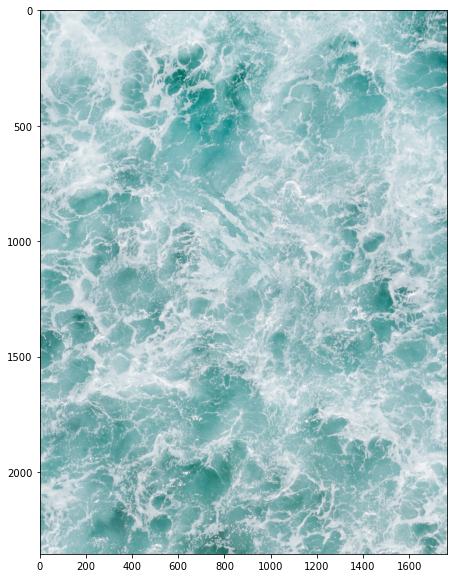

True

In [38]:
# run the algorithm
img2 = texture_synthesis(img1, 700, 700, 1200, 1000, w=5, l=5, hole_zone=hole_zone, Cmode="Best", watch_creating=False)
showing_image(img2)
result13 = cv2.cvtColor(img2, cv2.COLOR_RGB2BGR)
cv2.imwrite('result13.jpg', result13)

slide  1  is done!
slide  2  is done!
slide  3  is done!
slide  4  is done!
slide  5  is done!
slide  6  is done!
slide  7  is done!
slide  8  is done!
slide  9  is done!
slide  10  is done!
slide  11  is done!
slide  12  is done!
slide  13  is done!
slide  14  is done!
slide  15  is done!
slide  16  is done!
slide  17  is done!
slide  18  is done!
slide  19  is done!
slide  20  is done!
slide  21  is done!
slide  22  is done!
slide  23  is done!
slide  24  is done!
slide  25  is done!
slide  26  is done!
slide  27  is done!
slide  28  is done!
slide  29  is done!
slide  30  is done!
slide  31  is done!
slide  32  is done!
slide  33  is done!
slide  34  is done!
slide  35  is done!
slide  36  is done!
slide  37  is done!
slide  38  is done!
slide  39  is done!
slide  40  is done!
slide  41  is done!
slide  42  is done!
slide  43  is done!
slide  44  is done!
slide  45  is done!
slide  46  is done!
slide  47  is done!
slide  48  is done!
slide  49  is done!
slide  50  is done!
slide  51

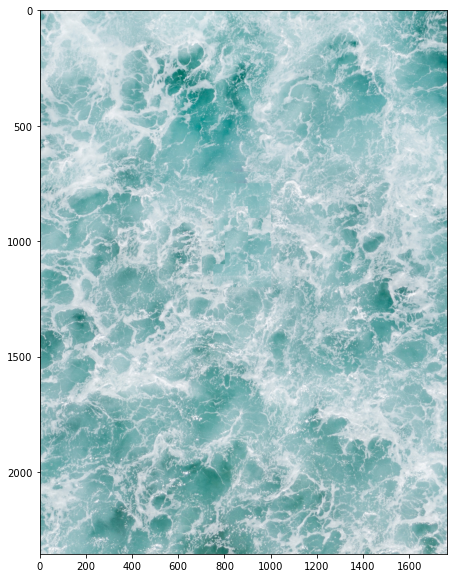

True

In [51]:
# run the algorithm
img2 = texture_synthesis(img1, 700, 700, 1200, 1000, w=50, l=50, hole_zone=hole_zone, Cmode="Best", watch_creating=False)
showing_image(img2)
result13_2 = cv2.cvtColor(img2, cv2.COLOR_RGB2BGR)
cv2.imwrite('result13_2.jpg', result13_2)

### HainesEagle

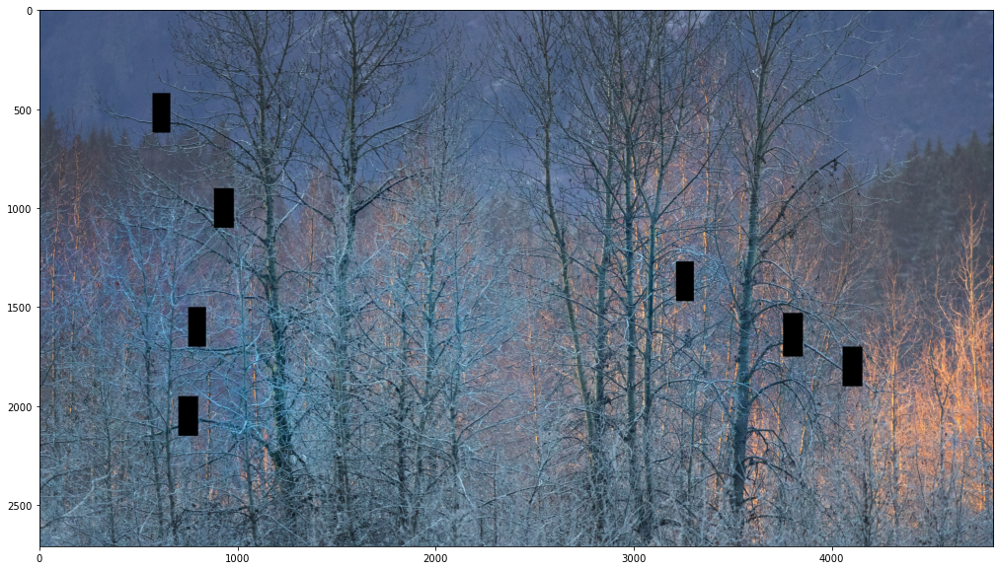

True

In [10]:
# Reading our images
img_org = reading_image('HainesEagle.jpg')

# creating holes
hole_zone = []
hole_zone.append((420, 570, 620, 660))
hole_zone.append((900, 880, 1100, 980))
hole_zone.append((1500, 750, 1700, 840))
hole_zone.append((1950, 700, 2150, 800))
hole_zone.append((1270, 3210, 1470, 3300))
hole_zone.append((1530, 3750, 1750, 3850))
hole_zone.append((1700, 4050, 1900, 4150))






img1 = hole_creating(img_org, hole_zone)

# Showing the images
showing_image(img1)

# saving the image
Q3_hole2 = cv2.cvtColor(img1, cv2.COLOR_RGB2BGR)
cv2.imwrite('Q3_hole2.jpg', Q3_hole2)

slide  1  is done!
slide  2  is done!
slide  3  is done!
slide  4  is done!
slide  5  is done!
slide  6  is done!
slide  7  is done!
slide  8  is done!
--------------
slide  1  is done!
slide  2  is done!
slide  3  is done!
slide  4  is done!
slide  5  is done!
slide  6  is done!
slide  7  is done!
slide  8  is done!
--------------
slide  1  is done!
slide  2  is done!
slide  3  is done!
slide  4  is done!
slide  5  is done!
slide  6  is done!
slide  7  is done!
slide  8  is done!
--------------
slide  1  is done!
slide  2  is done!
slide  3  is done!
slide  4  is done!
slide  5  is done!
slide  6  is done!
slide  7  is done!
slide  8  is done!
--------------
slide  1  is done!
slide  2  is done!
slide  3  is done!
slide  4  is done!
slide  5  is done!
slide  6  is done!
slide  7  is done!
slide  8  is done!
--------------
slide  1  is done!
slide  2  is done!
slide  3  is done!
slide  4  is done!
slide  5  is done!
slide  6  is done!
slide  7  is done!
slide  8  is done!
slide  9  is 

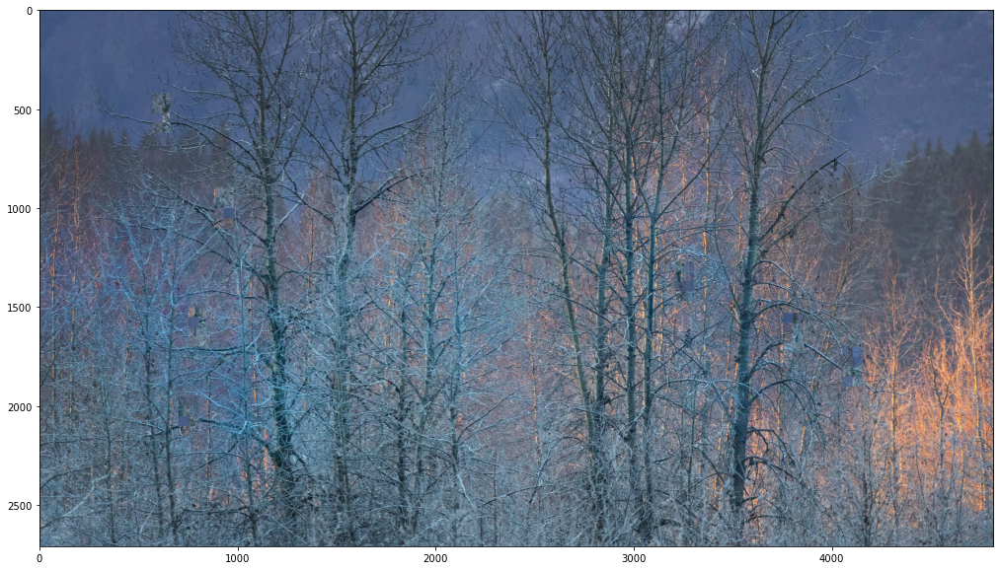

In [120]:
img2 = img1.copy()
# run the algorithm
for hole in hole_zone: 
    img2 = texture_synthesis(img2, hole[0], hole[1], hole[2], hole[3], w=50, l=50, w2=20, l2=20, hole_zone=hole_zone, Cmode="Random", watch_creating=False)


result12_random = cv2.cvtColor(img2, cv2.COLOR_RGB2BGR)
cv2.imwrite('result12_random.jpg', result12_random)
showing_image(img2)

slide  1  is done!
slide  2  is done!
slide  3  is done!
slide  4  is done!
slide  5  is done!
slide  6  is done!
slide  7  is done!
slide  8  is done!
slide  9  is done!
slide  10  is done!
slide  11  is done!
slide  12  is done!
slide  13  is done!
slide  14  is done!
slide  15  is done!
slide  16  is done!
slide  17  is done!
slide  18  is done!
slide  19  is done!
slide  20  is done!
slide  21  is done!
slide  22  is done!
slide  23  is done!
slide  24  is done!
slide  25  is done!
slide  26  is done!
slide  27  is done!
slide  28  is done!
slide  29  is done!
slide  30  is done!
slide  31  is done!
slide  32  is done!
slide  33  is done!
slide  34  is done!
slide  35  is done!
slide  36  is done!
slide  37  is done!
slide  38  is done!
slide  39  is done!
slide  40  is done!
slide  41  is done!
slide  42  is done!
slide  43  is done!
slide  44  is done!
slide  45  is done!
slide  46  is done!
slide  47  is done!
slide  48  is done!
slide  49  is done!
slide  50  is done!
---------

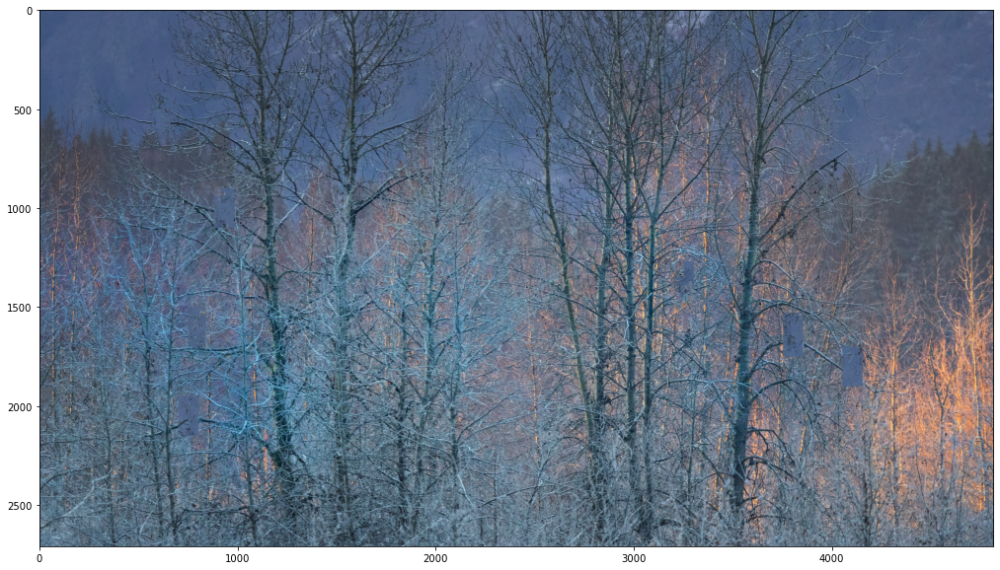

In [18]:
img2 = img1.copy()
# run the algorithm
for hole in hole_zone: 
    img2 = texture_synthesis(img2, hole[0], hole[1], hole[2], hole[3], w=20, l=20, w2=10, l2=10,
                             org_x1=320, org_y1=1400, org_x2=1900, org_y2=2100, hole_zone=hole_zone,
                             random_p=20000, Cmode="Best", watch_creating=False)

result12 = cv2.cvtColor(img2, cv2.COLOR_RGB2BGR)
cv2.imwrite('result12.jpg', result12)
showing_image(img2)